In [1]:
from pyspark.sql import SparkSession, functions as F
from pyspark.sql.functions import udf, col, size, stddev, mean
from pyspark.sql import Row
from pyspark.sql.functions import year, explode
from scipy import stats
import numpy as np
from graphframes import GraphFrame
import networkx as nx
from pyspark.sql.types import StringType, ArrayType, StructType, StructField, IntegerType, BooleanType
import time
import itertools
from scipy.stats import pearsonr
import random
import pandas as pd
from concurrent.futures import ProcessPoolExecutor, as_completed
from modules.network_metrics import calculate_single_node_clustering
from modules.network_metrics import approximate_betweenness
from modules.network_metrics import calculate_single_node_closeness
import json
import os
import pickle
from tqdm import tqdm
from pyspark.ml.feature import VectorAssembler, StringIndexer
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml import Pipeline
from pyspark.sql.types import FloatType
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore", category=UserWarning)


spark = SparkSession.builder \
    .appName("Network Analysis") \
    .config("spark.jars", "/root/graphframes-0.8.3-spark3.5-s_2.12.jar") \
    .config("spark.driver.memory", "192g") \
    .config("spark.executor.memory", "192g") \
    .getOrCreate()
spark.sparkContext.setLogLevel("ERROR")

24/01/05 10:32:56 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


### Loading GraphFrame diagrams and printing basic information

In [2]:
vertices = spark.read.format("parquet").load("./networkModel/1990_to_2010/vertices")
edges = spark.read.format("parquet").load("./networkModel/1990_to_2010/edges")

gf_graph = GraphFrame(vertices, edges)

print("Number of vertices:", gf_graph.vertices.count())
print("Number of edges:", gf_graph.edges.count())

print("Some vertices:")
gf_graph.vertices.show(3, truncate=False)

print("Some edges:")
gf_graph.edges.show(3, truncate=False)

Number of vertices: 219503
Number of edges: 1180804
Some vertices:
+-----------------+------------------------------+
|id               |oscars                        |
+-----------------+------------------------------+
|Christopher Nolan|[]                            |
|Willem Dafoe     |[{1987, false}, {2001, false}]|
|David Kelly      |[]                            |
+-----------------+------------------------------+
only showing top 3 rows

Some edges:
+--------------+-----------------+--------------+--------------------+
|src           |dst              |collaborations|total_collaborations|
+--------------+-----------------+--------------+--------------------+
|A Boemboem    |Purnomo A. Chakil|[2006-06-22]  |1                   |
|A K Lohithadas|Mamukkoya        |[2000-10-29]  |1                   |
|A Leung Wong  |Teguh Leo        |[2009-10-03]  |1                   |
+--------------+-----------------+--------------+--------------------+
only showing top 3 rows



### Converting graphframe graphs to networkx graphs

In [3]:
def graphframe_to_networkx(vertices, edges):
    G = nx.Graph()
    for row in vertices.collect():
        G.add_node(row.id, **row.asDict())
    for row in edges.collect():
        G.add_edge(row.src, row.dst, **row.asDict())
    return G

def load_or_create_graph(vertices, edges, path):
    if os.path.exists(path):
        print(f"Loading graph from {path}")
        with open(path, 'rb') as f:
            G = pickle.load(f)
    else:
        print(f"Creating graph...")
        G = graphframe_to_networkx(vertices, edges)
        with open(path, 'wb') as f:
            pickle.dump(G, f, protocol=pickle.HIGHEST_PROTOCOL)
        print(f"Graph saved to {path}")
    return G

save_path = "./networkModel/1990_to_2010/networkx_graph.gpickle"

nx_graph = load_or_create_graph(vertices, edges, save_path)

Loading graph from ./networkModel/1990_to_2010/networkx_graph.gpickle


In [4]:
print("Number of vertices:", nx_graph.number_of_nodes())
print("Number of edges:", nx_graph.number_of_edges())

print("Some vertices:")
for i, node in enumerate(nx_graph.nodes(data=True)):
    print(node)
    if i >= 2: 
        break

print("Some edges:")
for i, edge in enumerate(nx_graph.edges(data=True)):
    print(edge)
    if i >= 2: 
        break

Number of vertices: 219503
Number of edges: 1180804
Some vertices:
('Christopher Nolan', {'id': 'Christopher Nolan', 'oscars': []})
('Willem Dafoe', {'id': 'Willem Dafoe', 'oscars': [Row(year_ceremony=1987, winner=False), Row(year_ceremony=2001, winner=False)]})
('David Kelly', {'id': 'David Kelly', 'oscars': []})
Some edges:
('Christopher Nolan', 'Ken Watanabe', {'src': 'Christopher Nolan', 'dst': 'Ken Watanabe', 'collaborations': ['2010-07-15'], 'total_collaborations': 1})
('Christopher Nolan', 'Lucy Russell', {'src': 'Christopher Nolan', 'dst': 'Lucy Russell', 'collaborations': ['1999-04-02'], 'total_collaborations': 1})
('Christopher Nolan', 'Mark Boone Junior', {'src': 'Christopher Nolan', 'dst': 'Mark Boone Junior', 'collaborations': ['2000-10-11'], 'total_collaborations': 1})


### Classification Node

In [5]:
def classify_person(oscars_list):
    has_won = any(item['winner'] for item in oscars_list)
    has_been_nominated = any(not item['winner'] for item in oscars_list)
    
    if has_won:
        return "Winner"
    elif has_been_nominated:
        return "Nominee"
    else:
        return "Non-Awardee"

classify_udf = udf(classify_person, StringType())

vertices_with_classification = vertices.withColumn("classification", classify_udf(col("oscars")))

vertices_with_classification.show(3, truncate=False)

classification_counts = vertices_with_classification.groupBy("classification").count()

classification_counts.show()

+-----------------+------------------------------+--------------+
|id               |oscars                        |classification|
+-----------------+------------------------------+--------------+
|Christopher Nolan|[]                            |Non-Awardee   |
|Willem Dafoe     |[{1987, false}, {2001, false}]|Nominee       |
|David Kelly      |[]                            |Non-Awardee   |
+-----------------+------------------------------+--------------+
only showing top 3 rows



+--------------+------+
|classification| count|
+--------------+------+
|        Winner|   252|
|   Non-Awardee|218764|
|       Nominee|   487|
+--------------+------+



### Degree and Degree Centrality

In [6]:
degree_file = './results/degree_results.json'
centrality_file = './results/centrality_results.json'

def degree_and_centrality(nx_graph, degree_file, centrality_file):
    
    degree_dict = dict(nx_graph.degree())
    centrality_dict = nx.degree_centrality(nx_graph)

    with open(degree_file, 'w') as f:
        json.dump(degree_dict, f)

    with open(centrality_file, 'w') as f:
        json.dump(centrality_dict, f)

if not os.path.exists(degree_file) or not os.path.exists(centrality_file):
    degree_and_centrality(nx_graph, degree_file, centrality_file)
else:
    with open(degree_file, 'r') as f:
        degree_dict = json.load(f)
    with open(centrality_file, 'r') as f:
        centrality_dict = json.load(f)
    print("Loaded existing degree and centrality results.")

degree_df = pd.DataFrame(list(degree_dict.items()), columns=['id', 'Degree'])
degree_sdf = spark.createDataFrame(degree_df)
degree_sdf.show(3, truncate=False)

centrality_df = pd.DataFrame(list(centrality_dict.items()), columns=['id', 'Degree Centrality'])
centrality_sdf = spark.createDataFrame(centrality_df)
centrality_sdf.show(3, truncate=False)

Loaded existing degree and centrality results.


+-----------------+------+
|id               |Degree|
+-----------------+------+
|Christopher Nolan|49    |
|Willem Dafoe     |275   |
|David Kelly      |45    |
+-----------------+------+
only showing top 3 rows

+-----------------+---------------------+
|id               |Degree Centrality    |
+-----------------+---------------------+
|Christopher Nolan|2.2323259013585297E-4|
|Willem Dafoe     |0.0012528359650481543|
|David Kelly      |2.0500952155333435E-4|
+-----------------+---------------------+
only showing top 3 rows



### Computing the Clustering Coefficient in parallel by Stratified sampling

In [7]:
def stratified_sampling_clustering_parallel(nx_graph, vertices_df, sample_size=100):
    
    node_classification = {row['id']: row['classification'] for row in vertices_df.collect()}
    
    classified_nodes = {'Winner': [], 'Nominee': [], 'Non-Awardee': []}
    for node, classification in node_classification.items():
        classified_nodes[classification].append(node)

    clustering_results = {}
    for classification, nodes in classified_nodes.items():
        
        actual_sample_size = min(sample_size, len(nodes))
        sampled_nodes = random.sample(nodes, actual_sample_size)
        
        with ProcessPoolExecutor() as executor:
            futures = {executor.submit(calculate_single_node_clustering, nx_graph, node): node for node in sampled_nodes}
            for future in as_completed(futures):
                node, clustering = future.result()
                clustering_results[node] = clustering

    return clustering_results

if not os.path.exists('./results/clustering_results.json'):
    clustering_dict = stratified_sampling_clustering_parallel(nx_graph, vertices_with_classification)

    with open('./results/clustering_results.json', 'w') as f:
        json.dump(clustering_dict, f)
else:
    with open('./results/clustering_results.json', 'r') as f:
        clustering_dict = json.load(f)
    print("Loaded clustering results from existing file.")
    
clustering_df = pd.DataFrame(list(clustering_dict.items()), columns=['id', 'Clustering coefficient'])
clustering_sdf = spark.createDataFrame(clustering_df)
clustering_sdf.show(3, truncate=False)

Loaded clustering results from existing file.
+--------------------+----------------------+
|id                  |Clustering coefficient|
+--------------------+----------------------+
|Joan Fontaine       |1.0                   |
|Francis Ford Coppola|0.06489931913660728   |
|Kevin Spacey        |0.04376877654615145   |
+--------------------+----------------------+
only showing top 3 rows



### Computing the Betweenness Centrality in parallel by Random sampling

In [8]:
def approximate_betweenness_parallel(nx_graph, proportion=0.1):
    total_nodes = len(nx_graph.nodes())
    k = max(int(total_nodes * proportion), 1)  

    with ProcessPoolExecutor() as executor:
        with tqdm(total=1, desc="Calculating Approximate Betweenness") as progress:
            future = executor.submit(approximate_betweenness, nx_graph, k)
            betweenness_results = future.result()
            progress.update(1)

    return betweenness_results

if not os.path.exists('./results/betweenness_results.json'):
    betweenness_dict = approximate_betweenness_parallel(nx_graph)

    with open('./results/betweenness_results.json', 'w') as f:
        json.dump(betweenness_dict, f)
else:
    with open('./results/betweenness_results.json', 'r') as f:
        betweenness_dict = json.load(f)
    print("Loaded betweenness results from existing file.")
    
betweenness_df = pd.DataFrame(list(betweenness_dict.items()), columns=['id', 'Betweenness centrality'])
betweenness_sdf = spark.createDataFrame(betweenness_df)
betweenness_sdf.show(3, truncate=False)

Loaded betweenness results from existing file.
+-----------------+----------------------+
|id               |Betweenness centrality|
+-----------------+----------------------+
|Christopher Nolan|1.0938487666300819E-4 |
|Willem Dafoe     |0.0027946151355873693 |
|David Kelly      |5.887108415855853E-5  |
+-----------------+----------------------+
only showing top 3 rows



### Computing the Closeness Centrality in parallel by Stratified sampling

In [9]:
def stratified_sampling_closeness_centrality_parallel(nx_graph, vertices_df, sample_size=100):
    node_classification = {row['id']: row['classification'] for row in vertices_df.collect()}
    classified_nodes = {'Winner': [], 'Nominee': [], 'Non-Awardee': []}
    for node, classification in node_classification.items():
        classified_nodes[classification].append(node)

    closeness_centrality_results = {}
    for classification, nodes in classified_nodes.items():
        actual_sample_size = min(sample_size, len(nodes))
        sampled_nodes = random.sample(nodes, actual_sample_size)
        
        with ProcessPoolExecutor() as executor:
            futures = {executor.submit(calculate_single_node_closeness, nx_graph, node): node for node in sampled_nodes}
            for future in as_completed(futures):
                node, closeness = future.result()
                closeness_centrality_results[node] = closeness

    return closeness_centrality_results


if not os.path.exists('./results/closeness_centrality_results.json'):
    
    closeness_centrality_dict = stratified_sampling_closeness_centrality_parallel(nx_graph, vertices_with_classification)

    with open('./results/closeness_centrality_results.json', 'w') as f:
        json.dump(closeness_centrality_dict, f)
else:
    with open('./results/closeness_centrality_results.json', 'r') as f:
        closeness_centrality_dict = json.load(f)
    print("Loaded closeness results from existing file.")

closeness_df = pd.DataFrame(list(closeness_centrality_dict.items()), columns=['id', 'Closeness centrality'])
closeness_sdf = spark.createDataFrame(closeness_df)
closeness_sdf.show(3, truncate=False)

Loaded closeness results from existing file.
+----------------+--------------------+
|id              |Closeness centrality|
+----------------+--------------------+
|Jessica Lange   |0.2129957725384716  |
|Marlee Matlin   |0.20127840730500715 |
|John Schlesinger|0.20071264003183947 |
+----------------+--------------------+
only showing top 3 rows



### PageRank

In [10]:
if not os.path.exists("./results/pagerank_results"):
    pagerank_results = gf_graph.pageRank(resetProbability=0.15, maxIter=100)
    pagerank_results.vertices.select("id", "PageRank").write.format("parquet").save("./results/pagerank_results")
    pagerank_sdf = spark.read.format("parquet").load("./results/pagerank_results")
else:
    pagerank_sdf = spark.read.format("parquet").load("./results/pagerank_results")
    print("PageRank results already exist and Loaded it.")

pagerank_sdf.show(3, truncate=False)

PageRank results already exist and Loaded it.
+---------------------+------------------+
|id                   |PageRank          |
+---------------------+------------------+
|Affandi Abdul Rachman|0.8464887371200048|
|Alana Bock           |0.8464887371200048|
|Alexander Brunkovsky |0.8464887371200048|
+---------------------+------------------+
only showing top 3 rows



### Merge the resulting metric to the original vertices

In [11]:
vertices_with_metrics = vertices_with_classification.join(degree_sdf, ["id"], "left_outer") \
                                        .join(centrality_sdf, ["id"], "left_outer") \
                                        .join(clustering_sdf, ["id"], "left_outer") \
                                        .join(betweenness_sdf, ["id"], "left_outer") \
                                        .join(closeness_sdf, ["id"], "left_outer") \
                                        .join(pagerank_sdf,["id"], "left_outer")

vertices_with_metrics = vertices_with_metrics.na.fill("NA")

vertices_with_metrics.show(3, truncate=False)

+-------------------+--------------------------------------------+--------------+------+---------------------+----------------------+----------------------+--------------------+------------------+
|id                 |oscars                                      |classification|Degree|Degree Centrality    |Clustering coefficient|Betweenness centrality|Closeness centrality|PageRank          |
+-------------------+--------------------------------------------+--------------+------+---------------------+----------------------+----------------------+--------------------+------------------+
|Andrew Kevin Walker|[]                                          |Non-Awardee   |5     |2.2778835728148263E-5|NULL                  |0.0                   |NULL                |0.8464887371200048|
|Chris Renaud       |[]                                          |Non-Awardee   |13    |5.922497289318548E-5 |NULL                  |4.2522045958401165E-6 |NULL                |0.8464887371200048|
|Daniel Day-Lew

# The random forest model scores the importance of network metrics

In [12]:
labelIndexer = StringIndexer(inputCol="classification", outputCol="label").fit(vertices_with_metrics)

numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness centrality", "PageRank"]
vertices_with_metrics_numerical = vertices_with_metrics.select([col(c).cast(FloatType()).alias(c) if c in numerical_columns else col(c) for c in vertices_with_metrics.columns])

vertices_with_metrics_filled = vertices_with_metrics_numerical.na.fill(0)

assembler = VectorAssembler(inputCols=numerical_columns, outputCol="features")

rf = RandomForestClassifier(labelCol="label", featuresCol="features", numTrees=10)

pipeline = Pipeline(stages=[labelIndexer, assembler, rf])

model = pipeline.fit(vertices_with_metrics_filled)

rfModel = model.stages[-1]
importances = rfModel.featureImportances

for i, feature in enumerate(numerical_columns):
    print(f"{feature}: {importances[i]}")

Degree: 0.04977306312639056
Degree Centrality: 0.041722278165680075
Clustering coefficient: 0.43490269741024107
Betweenness centrality: 0.023824431853602068
Closeness centrality: 0.43905728708306085
PageRank: 0.01072024236102532


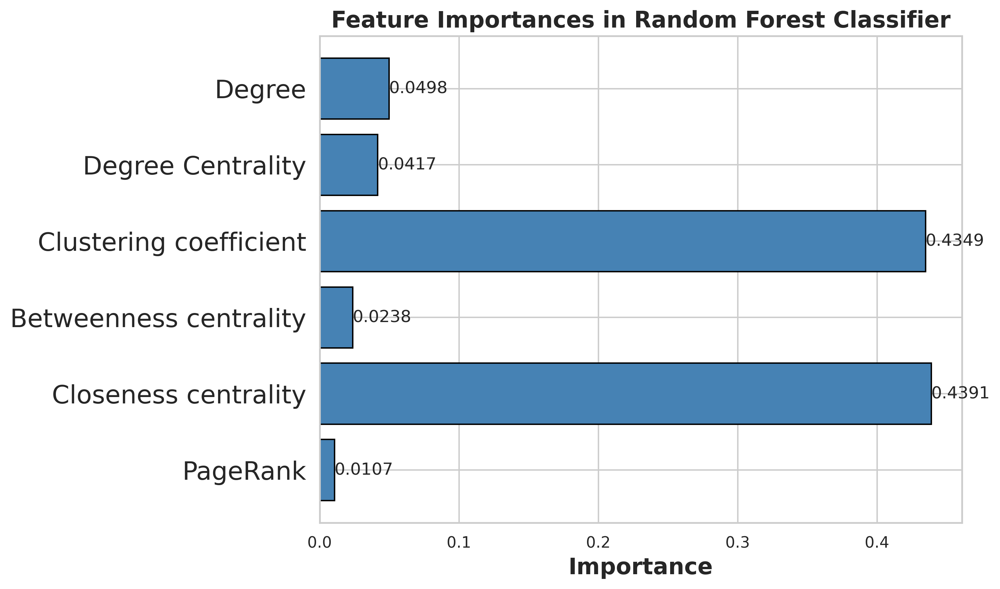

In [13]:
feature_importances = [importances[i] for i in range(len(importances))]
feature_names = numerical_columns

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6), dpi=300)
bars = plt.barh(feature_names, feature_importances, color='steelblue', edgecolor='black')

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, 
             f'{bar.get_width():.4f}', 
             va='center', ha='left')

    
plt.xlabel('Importance', fontsize=16, fontweight='bold')
plt.yticks(fontsize=18)

plt.title('Feature Importances in Random Forest Classifier', fontsize=16, fontweight='bold')

plt.gca().invert_yaxis()

plt.tight_layout()
plt.savefig('./charts/feature_importances.png')
plt.show()


# Analyzing Network Metrics

In [14]:
def analyze_category(category):
    category_metrics = vertices_with_metrics.filter(col("classification") == category)

    numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness Centrality", "PageRank"]
    category_metrics_numerical = category_metrics.select([col("id"), col("classification")] + [col(c).cast("float").alias(c) for c in numerical_columns])

    avg_metrics = category_metrics_numerical.groupBy().avg(*numerical_columns).collect()[0]

    results = {}
    for metric in numerical_columns:
        avg_val = avg_metrics[f"avg({metric})"]
        results[metric] = avg_val if avg_val is not None else "NA"

    return results

categories = ["Winner", "Nominee", "Non-Awardee"]
for category in categories:
    results = analyze_category(category)
    print(f"Average Network Metrics for {category}:")
    for metric, avg_val in results.items():
        print(f"  Average {metric}: {avg_val}")
    print("\n")

Average Network Metrics for Winner:
  Average Degree: 86.9563492063492
  Average Degree Centrality: 0.0003961528797722239
  Average Clustering coefficient: 0.19990990856662394
  Average Betweenness centrality: 0.0003636668561862997
  Average Closeness Centrality: 0.19959023132920264
  Average PageRank: 2.2620797254263407




Average Network Metrics for Nominee:
  Average Degree: 80.47022587268994
  Average Degree Centrality: 0.0003666036110587239
  Average Clustering coefficient: 0.2587585448846221
  Average Betweenness centrality: 0.00035129326367779707
  Average Closeness Centrality: 0.20095839753746986
  Average PageRank: 1.9332135784797355




Average Network Metrics for Non-Awardee:
  Average Degree: 10.515925837889233
  Average Degree Centrality: 4.790810923099011e-05
  Average Clustering coefficient: 0.7913392978906632
  Average Betweenness centrality: 1.4648563257971053e-05
  Average Closeness Centrality: 0.13725932213988018
  Average PageRank: 0.9964686902718258




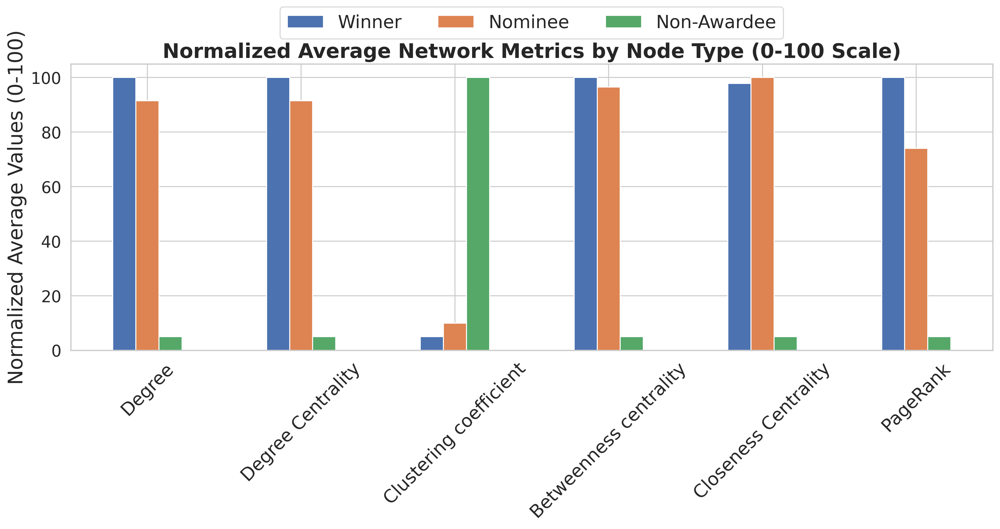

In [15]:
data = {category: analyze_category(category) for category in categories}
categories = ["Winner", "Nominee", "Non-Awardee"]
numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness Centrality", "PageRank"]

def normalize(values, min_threshold=5):
    min_val = np.min(values)
    max_val = np.max(values)
    normalized = [(value - min_val) / (max_val - min_val) * 100 for value in values]

    return [max(value, min_threshold) for value in normalized]

values_normalized = {metric: normalize([data[category][metric] for category in categories]) for metric in numerical_columns}

sns.set(style="whitegrid")
bar_width = 0.15
index = np.arange(len(numerical_columns))

plt.figure(figsize=(14, 8), dpi=300)
for i, category in enumerate(categories):
    plt.bar(index + bar_width * i, [values_normalized[metric][i] for metric in numerical_columns], bar_width, label=category)

plt.ylabel('Normalized Average Values (0-100)', fontsize=20)
plt.title('Normalized Average Network Metrics by Node Type (0-100 Scale)', fontsize=20, fontweight='bold')
plt.xticks(index + bar_width, numerical_columns, rotation=45, fontsize=18)
plt.yticks(fontsize=16)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.23), ncol=len(categories), fontsize=18)

plt.tight_layout()
plt.savefig('charts/normalized_min_threshold_average_network_metrics.png')
plt.show()

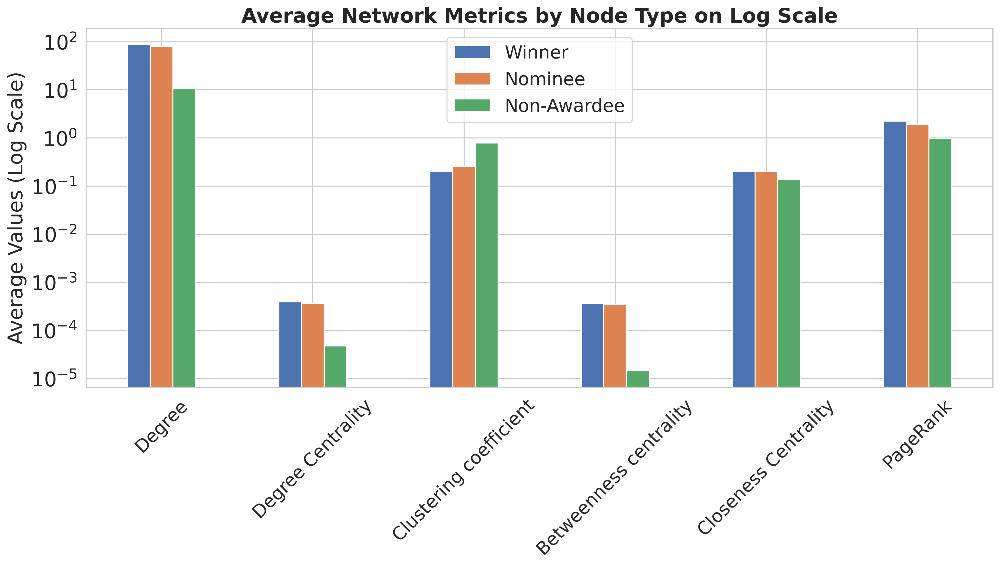

In [16]:
categories = ["Winner", "Nominee", "Non-Awardee"]
numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness Centrality", "PageRank"]

data = {category: analyze_category(category) for category in categories}

values = {metric: [data[category][metric] for category in categories] for metric in numerical_columns}

sns.set(style="whitegrid")

bar_width = 0.15
index = np.arange(len(numerical_columns))

plt.figure(figsize=(14, 8), dpi=300)
for i, category in enumerate(categories):
    plt.bar(index + bar_width * i, [values[metric][i] for metric in numerical_columns], bar_width, label=category)

plt.ylabel('Average Values (Log Scale)', fontsize=20)
plt.title('Average Network Metrics by Node Type on Log Scale', fontsize=20, fontweight='bold')
plt.xticks(index + bar_width, numerical_columns, rotation=45, fontsize=18)
plt.yticks(fontsize=20)
plt.yscale('log')  
plt.legend(fontsize=18)

plt.tight_layout()
plt.savefig('charts/average_network_metrics.png')
plt.show()

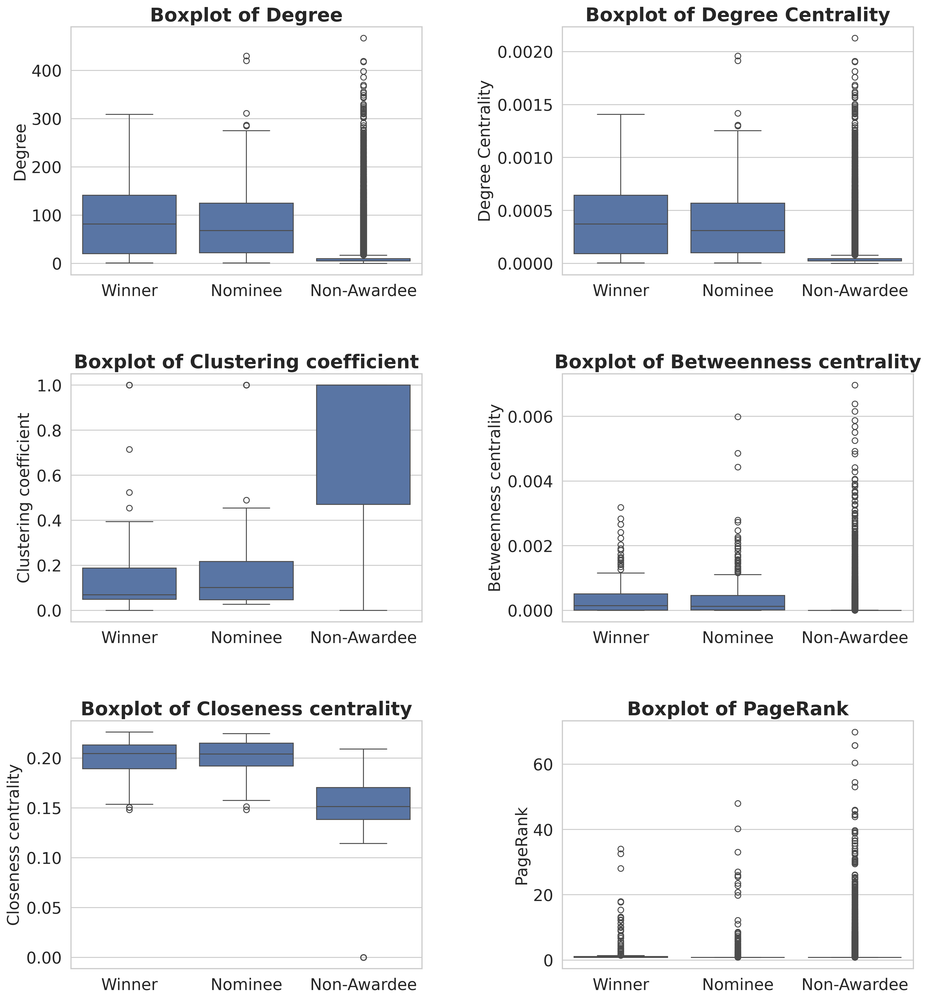

In [17]:
pandas_df = vertices_with_metrics.toPandas()

sns.set(style="whitegrid")

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(16, 18), dpi=300) 
fig.subplots_adjust(hspace=0.4, wspace=0.4)

numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness centrality", "PageRank"]
for i, column in enumerate(numerical_columns):
    ax = axes[i // 2, i % 2]
    sns.boxplot(x="classification", y=column, data=pandas_df, order=categories, ax=ax)
    ax.set_title(f'Boxplot of {column}', fontsize=20, fontweight='bold')
    ax.set_ylabel(column, fontsize=17)
    ax.set_xlabel('')
    ax.tick_params(labelsize=17) 
fig.savefig('charts/network_metrics_boxplots.png')
plt.show()

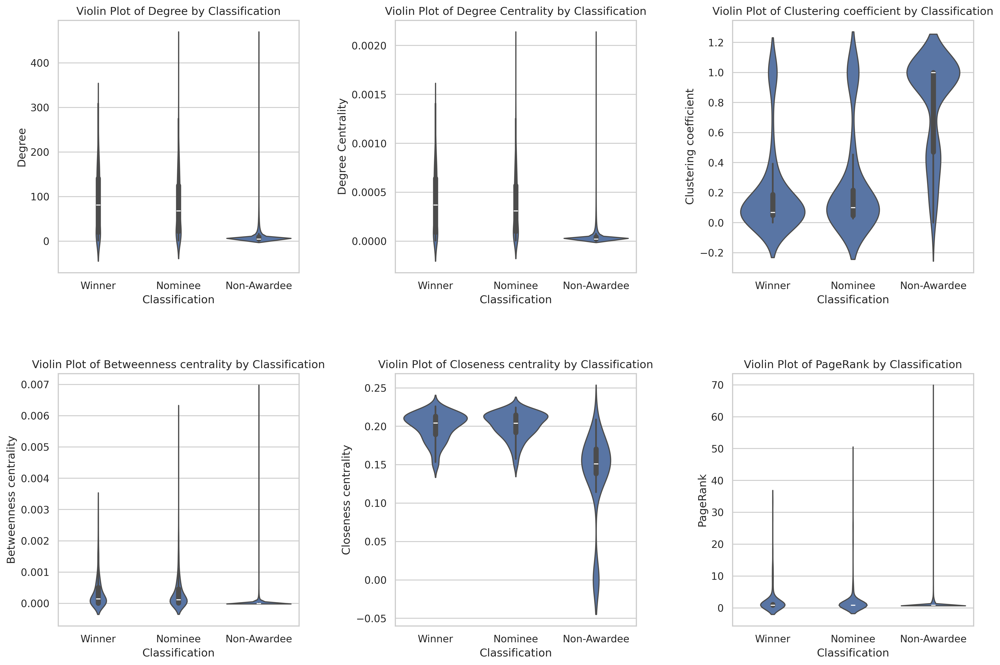

In [18]:
pandas_df = vertices_with_metrics.toPandas()

sns.set(style="whitegrid")

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12), dpi=300)
fig.subplots_adjust(hspace=0.4, wspace=0.4)

numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness centrality", "PageRank"]
for i, column in enumerate(numerical_columns):
    ax = axes[i // 3, i % 3]
    sns.violinplot(x="classification", y=column, data=pandas_df, order=categories, ax=ax)
    ax.set_title(f'Violin Plot of {column} by Classification')
    ax.set_xlabel('Classification')
    ax.set_ylabel(column)

plt.show()

### ANOVA analysis

In [19]:
def get_category_data(category, feature):
    return vertices_with_metrics.filter(col("classification") == category).select(col(feature)).na.drop().toPandas()[feature]

features = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness Centrality", "PageRank"]
results = []

for feature in features:
    winners_data = get_category_data("Winner", feature)
    nominees_data = get_category_data("Nominee", feature)
    non_awardees_data = get_category_data("Non-Awardee", feature)
    
    f_val, p_val = stats.f_oneway(winners_data, nominees_data, non_awardees_data)
    results.append((feature, f_val, p_val))

for feature, f_val, p_val in results:
    print(f"ANOVA for {feature}: F-value = {f_val}, p-value = {p_val}")

ANOVA for Degree: F-value = 6180.530745585165, p-value = 0.0
ANOVA for Degree Centrality: F-value = 6180.530745585164, p-value = 0.0
ANOVA for Clustering coefficient: F-value = 104.87310700952625, p-value = 3.4909336012719115e-35
ANOVA for Betweenness centrality: F-value = 4435.830054165523, p-value = 0.0
ANOVA for Closeness Centrality: F-value = 104.57425032373604, p-value = 4.1596467714759855e-35
ANOVA for PageRank: F-value = 478.7334048004444, p-value = 3.4743039964762235e-208


# Correlation analysis between network metrics and number of awards

In [20]:
def calculate_award_count(oscars):
    count = 0.0
    for record in oscars:
        if record['winner']:
            count += 1.0  
        else:
            count += 0.5  
    return count

calculate_award_count_udf = udf(calculate_award_count, FloatType())

vertices_with_metrics = vertices_with_metrics.withColumn("award_count", calculate_award_count_udf(vertices_with_metrics["oscars"]))

vertices_with_metrics.show(3, truncate=False)

+-------------------+--------------------------------------------+--------------+------+---------------------+----------------------+----------------------+--------------------+------------------+-----------+
|id                 |oscars                                      |classification|Degree|Degree Centrality    |Clustering coefficient|Betweenness centrality|Closeness centrality|PageRank          |award_count|
+-------------------+--------------------------------------------+--------------+------+---------------------+----------------------+----------------------+--------------------+------------------+-----------+
|Andrew Kevin Walker|[]                                          |Non-Awardee   |5     |2.2778835728148263E-5|NULL                  |0.0                   |NULL                |0.8464887371200048|0.0        |
|Chris Renaud       |[]                                          |Non-Awardee   |13    |5.922497289318548E-5 |NULL                  |4.2522045958401165E-6 |NULL    

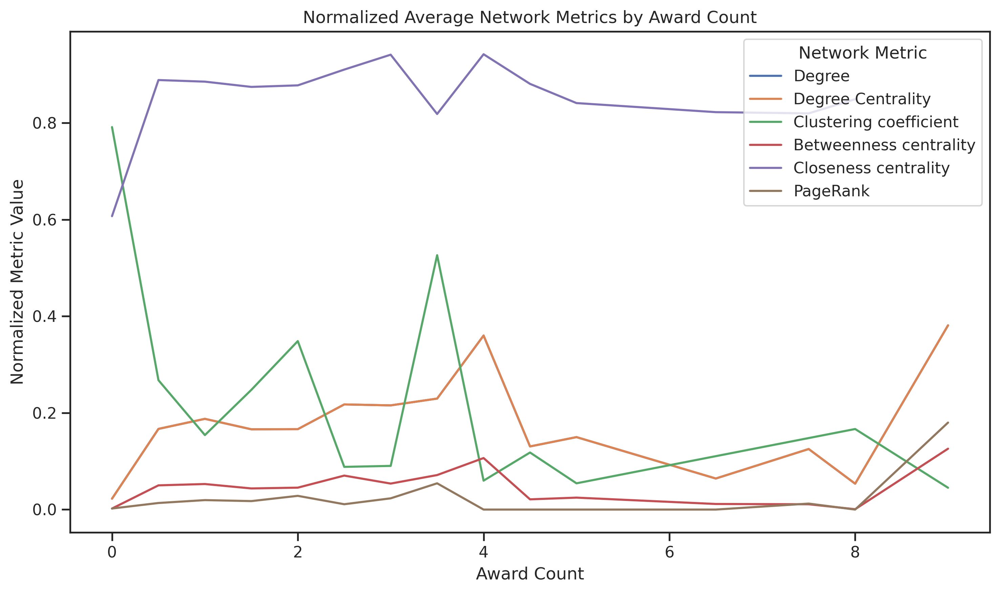

In [21]:
from sklearn.preprocessing import MinMaxScaler

pandas_df = vertices_with_metrics.toPandas()

sns.set(style="ticks")

plt.figure(figsize=(10, 6), dpi=300)

scaler = MinMaxScaler()

numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness centrality", "PageRank"]
metric_values = pandas_df[numerical_columns]
scaled_metrics = scaler.fit_transform(metric_values)
scaled_df = pd.DataFrame(scaled_metrics, columns=numerical_columns)
scaled_df['award_count'] = pandas_df['award_count']

for column in numerical_columns:
    sns.lineplot(data=scaled_df, x='award_count', y=column, label=column, errorbar=None)

plt.title('Normalized Average Network Metrics by Award Count')
plt.xlabel('Award Count')
plt.ylabel('Normalized Metric Value')
plt.legend(title='Network Metric')

plt.tight_layout()
plt.savefig('normalized_average_network_metrics_by_award_count.png')
plt.show()

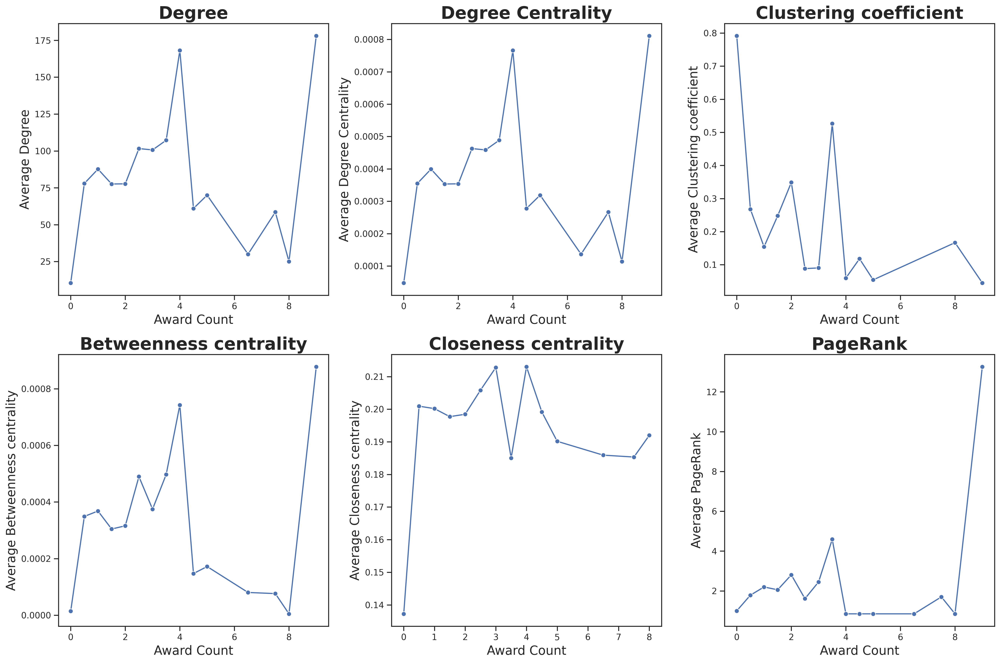

In [22]:
sns.set(style="ticks")

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12), dpi=300)
fig.subplots_adjust(hspace=0.4, wspace=0.4)

numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness centrality", "PageRank"]
for i, column in enumerate(numerical_columns):
    ax = axes[i // 3, i % 3]
    mean_metrics = pandas_df.groupby('award_count')[column].mean().reset_index()
    sns.lineplot(x='award_count', y=column, data=mean_metrics, ax=ax, marker='o')
    ax.set_title(f'{column}', fontsize=22, fontweight='bold')
    ax.set_xlabel('Award Count', fontsize=16)
    ax.set_ylabel(f'Average {column}', fontsize=16)

plt.tight_layout()
plt.savefig('charts/average_network_metrics_by_award_count.png')
plt.show()

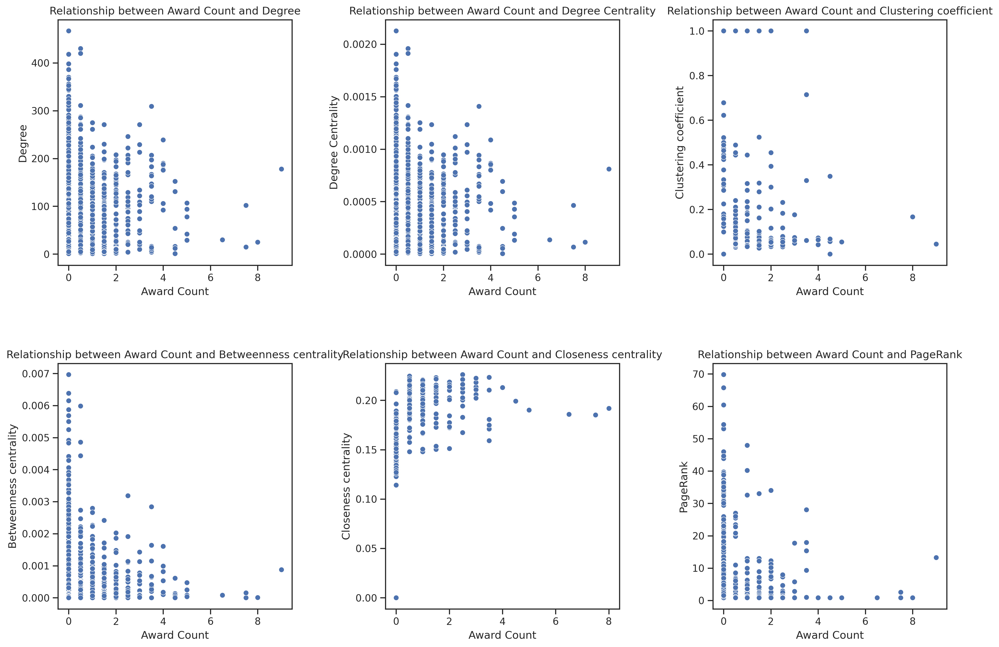

In [23]:
pandas_df = vertices_with_metrics.toPandas()

sns.set(style="ticks")

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12), dpi=300)
fig.subplots_adjust(hspace=0.4, wspace=0.4)

numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness centrality", "PageRank"]
for i, column in enumerate(numerical_columns):
    ax = axes[i // 3, i % 3]
    sns.scatterplot(x="award_count", y=column, data=pandas_df, ax=ax)
    ax.set_title(f'Relationship between Award Count and {column}')
    ax.set_xlabel('Award Count')
    ax.set_ylabel(column)

plt.show()

In [24]:
pandas_df = vertices_with_metrics.toPandas()
numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness centrality", "PageRank"]

sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 2, figsize=(16, 18), dpi=600)
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i, column in enumerate(numerical_columns):
    sns.boxplot(x='award_count', y=column, data=pandas_df, ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Boxplot of {column}', fontsize=20, fontweight='bold')
    axes[i//2, i%2].set_ylabel(column, fontsize=17)
    axes[i//2, i%2].set_xlabel('Award Count', fontsize=17)
    axes[i//2, i%2].tick_params(labelsize=17) 
    
plt.tight_layout()
plt.savefig('charts/boxplot_by_award_count.png')
plt.show()

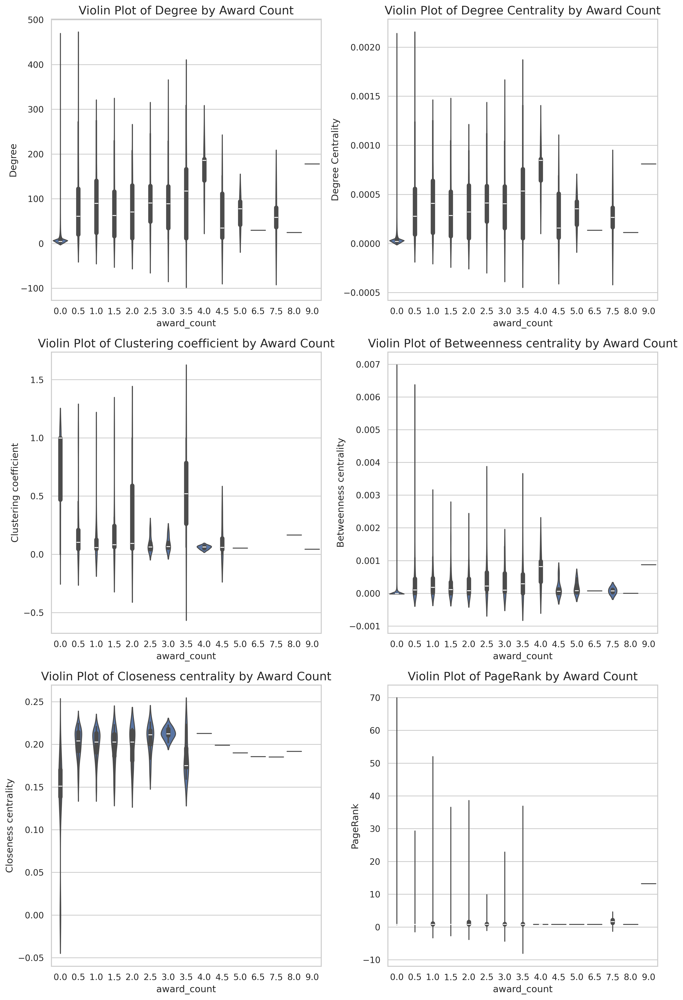

In [25]:
pandas_df = vertices_with_metrics.toPandas()

sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 2, figsize=(12, 18), dpi=300)
fig.subplots_adjust(hspace=0.4, wspace=0.4)

numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness centrality", "PageRank"]


for i, column in enumerate(numerical_columns):
    sns.violinplot(x='award_count', y=column, data=pandas_df, ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Violin Plot of {column} by Award Count', fontsize=15)
    ax.set_ylabel(column, fontsize=15)
    ax.set_xlabel('Award Count', fontsize=15)
    ax.tick_params(labelsize=15)
    
plt.tight_layout()
plt.savefig('charts/violin_by_award_count.png')
plt.show()

### The Pearson correlation coefficient between each network metric and the number of awards was calculated

Pearson Correlation Coefficients with Award Count:
Degree                    0.181686
Degree Centrality         0.181686
Clustering coefficient   -0.383376
Betweenness centrality    0.149765
Closeness centrality      0.344400
PageRank                  0.058836
Name: award_count, dtype: float64


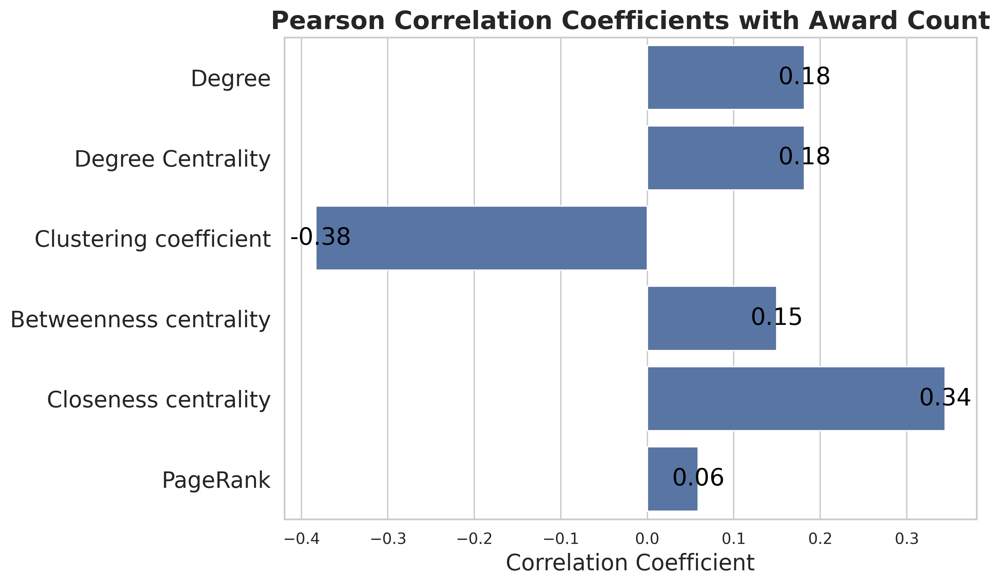

In [26]:
pandas_df = vertices_with_metrics.toPandas()

numerical_columns = ["Degree", "Degree Centrality", "Clustering coefficient", "Betweenness centrality", "Closeness centrality", "PageRank"]
correlation_results = pandas_df[numerical_columns + ["award_count"]].corr(method='pearson')

award_correlations = correlation_results["award_count"].drop("award_count")

print("Pearson Correlation Coefficients with Award Count:")
print(award_correlations)

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6), dpi=300)
bar_plot = sns.barplot(x=award_correlations.values, y=award_correlations.index)

plt.title('Pearson Correlation Coefficients with Award Count', fontsize=18, fontweight='bold')
plt.xlabel('Correlation Coefficient', fontsize=16)

plt.ylabel('')
plt.yticks(fontsize=16)

plt.tick_params(labelright=False)

for i, value in enumerate(award_correlations.values):
    text_position = value if value >= 0 else value - 0.03 
    ha_position = 'center' if value >= 0 else 'left'
    bar_plot.text(
        text_position, i, 
        f"{value:.2f}", 
        ha=ha_position, va='center', 
        fontsize=17, color='black'
    )
plt.tight_layout()
plt.savefig("charts/correlation_chart.png")

plt.show()

# Whether winning an Oscar significantly changes a filmmaker's position and connections in the film industry's collaborative network

### Filter out Oscar winners who have won only one Oscar

In [27]:
def has_single_true_award_in_period(oscars):
    return len(oscars) == 1 and oscars[0].winner and 1995 <= oscars[0].year_ceremony <= 2005

has_single_true_award_in_period_udf = udf(has_single_true_award_in_period, BooleanType())

single_true_award_in_period_vertices = vertices_with_metrics.withColumn("has_single_true_award_in_period", has_single_true_award_in_period_udf("oscars")) \
                                                            .filter("has_single_true_award_in_period")

single_true_award_in_period_count = single_true_award_in_period_vertices.count()

print(f"Number of vertices with exactly one Oscar win between 1995 and 2005: {single_true_award_in_period_count}")
single_true_award_in_period_vertices.show(truncate=False)

Number of vertices with exactly one Oscar win between 1995 and 2005: 15


+--------------------+--------------+--------------+------+---------------------+----------------------+----------------------+--------------------+------------------+-----------+-------------------------------+
|id                  |oscars        |classification|Degree|Degree Centrality    |Clustering coefficient|Betweenness centrality|Closeness centrality|PageRank          |award_count|has_single_true_award_in_period|
+--------------------+--------------+--------------+------+---------------------+----------------------+----------------------+--------------------+------------------+-----------+-------------------------------+
|Robert Zemeckis     |[{1995, true}]|Winner        |70    |3.1890370019407567E-4|0.10476190476190476   |7.249330982446888E-5  |0.2071031571966017  |0.8464887371200048|1.0        |true                           |
|Jim Broadbent       |[{2002, true}]|Winner        |183   |8.337053876502264E-4 |NULL                  |7.758532770592065E-4  |NULL                |2.97

### Oscar winners who had made at least one film in each of the five years before and after winning an Oscar were selected from those who had won only one Oscar

In [28]:
from pyspark.sql.functions import explode, year, col

edges_exploded = edges.select("*", explode("collaborations").alias("collab_date"))
edges_exploded = edges_exploded.withColumn("collab_year", year("collab_date"))

winners_list = [row.id for row in single_true_award_in_period_vertices.collect()]
for winner_id in winners_list:
    award_year = single_true_award_in_period_vertices.filter(single_true_award_in_period_vertices.id == winner_id) \
                                                    .first().oscars[0].year_ceremony

    start_year = award_year - 5
    end_year = award_year + 5

    collaboration_years = edges_exploded.filter(
        ((col("src") == winner_id) | (col("dst") == winner_id)) &
        (col("collab_year").between(start_year, end_year))
    ).select("collab_year").distinct().count()

    if collaboration_years == 11:
        print(f"Winner {winner_id} had at least one collaboration each year from {start_year} to {end_year}")

Winner Halle Berry had at least one collaboration each year from 1997 to 2007


Winner Adrien Brody had at least one collaboration each year from 1998 to 2008


### The indicator data of the subnetworks are calculated and saved by year

In [29]:
from pyspark.sql.functions import col, explode, year as year_func

def graphframe_to_networkx(vertices, edges):
    G = nx.Graph()
    for row in vertices.collect():
        G.add_node(row.id, **row.asDict())
    for row in edges.collect():
        G.add_edge(row.src, row.dst, **row.asDict())
    return G

def are_metrics_files_complete(year_dir):
    expected_files = ['degree.csv', 'centrality.csv', 'pagerank.csv', 'clustering.csv', 'betweenness.csv', 'closeness.csv']
    return all(os.path.exists(os.path.join(year_dir, f)) for f in expected_files)

def save_network_metrics(year, vertices, edges):
    year_dir = f'./results/{year}'
    if os.path.exists(year_dir) and are_metrics_files_complete(year_dir):
        print(f"Data for year {year} is already complete. Skipping...")
        return

    if not os.path.exists(year_dir):
        os.makedirs(year_dir)

    yearly_graphframe = GraphFrame(vertices, edges)
    nx_graph = graphframe_to_networkx(vertices, edges)

    print(f"Year: {year}, Nodes: {nx_graph.number_of_nodes()}, Edges: {nx_graph.number_of_edges()}")

    pd.DataFrame(nx.degree(nx_graph), columns=['id', 'Degree']).to_csv(f'{year_dir}/degree.csv', index=False)
    pd.DataFrame(nx.degree_centrality(nx_graph).items(), columns=['id', 'Degree Centrality']).to_csv(f'{year_dir}/centrality.csv', index=False)
    pd.DataFrame(nx.pagerank(nx_graph).items(), columns=['id', 'PageRank']).to_csv(f'{year_dir}/pagerank.csv', index=False)
    pd.DataFrame(nx.clustering(nx_graph).items(), columns=['id', 'Clustering']).to_csv(f'{year_dir}/clustering.csv', index=False)
    pd.DataFrame(nx.betweenness_centrality(nx_graph).items(), columns=['id', 'Betweenness']).to_csv(f'{year_dir}/betweenness.csv', index=False)
    pd.DataFrame(nx.closeness_centrality(nx_graph).items(), columns=['id', 'Closeness']).to_csv(f'{year_dir}/closeness.csv', index=False)

    print(f"Network metrics for {year} saved successfully.")

def process_network(year, vertices, edges):
    yearly_edges = edges.withColumn("collab", explode("collaborations")) \
                        .withColumn("collab_year", year_func("collab")) \
                        .filter(col("collab_year") == year) \
                        .select("src", "dst")

    save_network_metrics(year, vertices, yearly_edges)

for year in range(1990, 2011):  # Loop from 1990 to 2010
    process_network(year, vertices, edges)

Data for year 1990 is already complete. Skipping...
Data for year 1991 is already complete. Skipping...
Data for year 1992 is already complete. Skipping...
Data for year 1993 is already complete. Skipping...
Data for year 1994 is already complete. Skipping...
Data for year 1995 is already complete. Skipping...
Data for year 1996 is already complete. Skipping...
Data for year 1997 is already complete. Skipping...
Data for year 1998 is already complete. Skipping...
Data for year 1999 is already complete. Skipping...
Data for year 2000 is already complete. Skipping...
Data for year 2001 is already complete. Skipping...
Data for year 2002 is already complete. Skipping...
Data for year 2003 is already complete. Skipping...
Data for year 2004 is already complete. Skipping...
Data for year 2005 is already complete. Skipping...
Data for year 2006 is already complete. Skipping...
Data for year 2007 is already complete. Skipping...
Data for year 2008 is already complete. Skipping...
Data for yea

### Load the Subnetworks metrics by Specified Winners

In [30]:
winners = ['Halle Berry', 'Adrien Brody']
winner_metrics = pd.DataFrame(columns=['Year', 'Winner', 'Degree', 'Centrality', 'PageRank', 'Clustering', 'Betweenness', 'Closeness'])

idx = 0
for yr in tqdm(range(1997, 2009), desc="Extracting Winner Metrics"):
    for winner in winners:
        year_dir = f'./results/{yr}'
        degree_df = pd.read_csv(f'{year_dir}/degree.csv')
        centrality_df = pd.read_csv(f'{year_dir}/centrality.csv')
        pagerank_df = pd.read_csv(f'{year_dir}/pagerank.csv')
        clustering_df = pd.read_csv(f'{year_dir}/clustering.csv')
        betweenness_df = pd.read_csv(f'{year_dir}/betweenness.csv')
        closeness_df = pd.read_csv(f'{year_dir}/closeness.csv')

        winner_metrics.loc[idx] = [
            yr,
            winner,
            degree_df[degree_df['id'] == winner]['Degree'].values[0],
            centrality_df[centrality_df['id'] == winner]['Degree Centrality'].values[0],
            pagerank_df[pagerank_df['id'] == winner]['PageRank'].values[0],
            clustering_df[clustering_df['id'] == winner]['Clustering'].values[0],
            betweenness_df[betweenness_df['id'] == winner]['Betweenness'].values[0],
            closeness_df[closeness_df['id'] == winner]['Closeness'].values[0]
        ]
        idx += 1


Extracting Winner Metrics: 100%|██████████| 12/12 [00:24<00:00,  2.02s/it]


In [31]:
halle_berry_metrics = winner_metrics[winner_metrics['Winner'] == 'Halle Berry']

adrien_brody_metrics = winner_metrics[winner_metrics['Winner'] == 'Adrien Brody']

def show(df):
    with pd.option_context('display.max_rows', None, 'display.max_columns', None):
        print(df.to_string(index=False))

show(halle_berry_metrics)
show(adrien_brody_metrics)

 Year      Winner  Degree  Centrality  PageRank  Clustering  Betweenness  Closeness
 1997 Halle Berry       5    0.000023  0.000007    1.000000     0.000000   0.005008
 1998 Halle Berry      10    0.000046  0.000010    0.444444     0.000003   0.005328
 1999 Halle Berry       5    0.000023  0.000007    1.000000     0.000000   0.004922
 2000 Halle Berry       5    0.000023  0.000007    1.000000     0.000000   0.004801
 2001 Halle Berry      10    0.000046  0.000008    0.444444     0.000003   0.006376
 2002 Halle Berry      12    0.000055  0.000012    0.439394     0.000002   0.005465
 2003 Halle Berry       5    0.000023  0.000007    1.000000     0.000000   0.005957
 2004 Halle Berry      10    0.000046  0.000009    0.444444     0.000006   0.007240
 2005 Halle Berry      10    0.000046  0.000009    0.444444     0.000008   0.007067
 2006 Halle Berry       5    0.000023  0.000006    1.000000     0.000000   0.007991
 2007 Halle Berry      15    0.000068  0.000012    0.285714     0.000031   0

### Analysis of the average metrics before and after the award

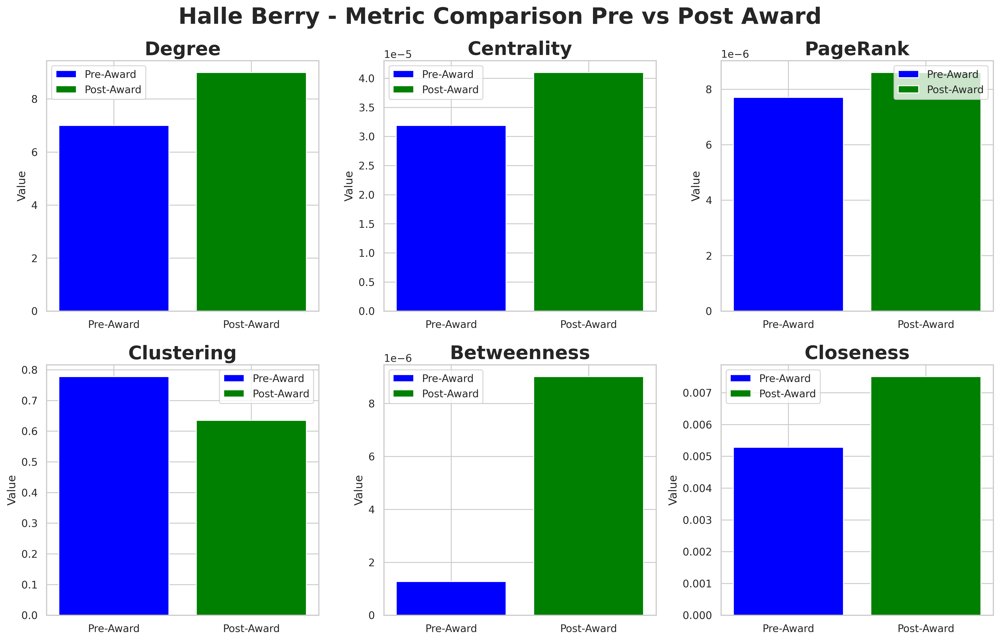

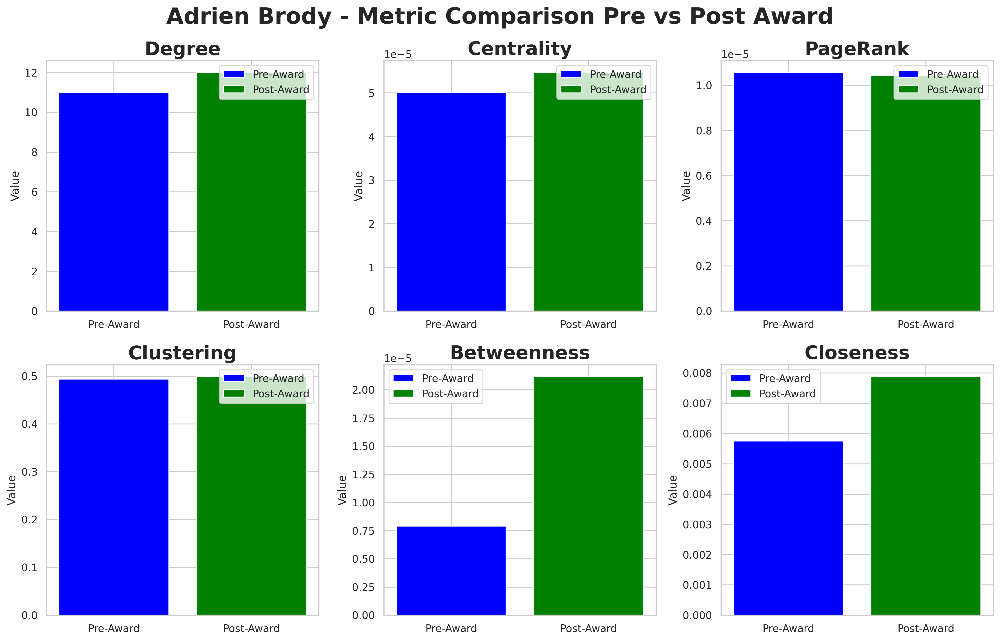

In [32]:
def calculate_average_metrics(df, start_year, end_year):
    relevant_data = df[(df['Year'] >= start_year) & (df['Year'] <= end_year)]

    numeric_data = relevant_data.drop(columns=['Year', 'Winner']).select_dtypes(include=[float, int])

    return numeric_data.mean()

halle_pre_award = calculate_average_metrics(halle_berry_metrics, 1997, 2001)
halle_post_award = calculate_average_metrics(halle_berry_metrics, 2003, 2007)

brody_pre_award = calculate_average_metrics(adrien_brody_metrics, 1998, 2002)
brody_post_award = calculate_average_metrics(adrien_brody_metrics, 2004, 2008)

def plot_individual_metrics(pre_award, post_award, title):
    metrics = pre_award.index
    fig, axes = plt.subplots(2, 3, figsize=(15, 10), dpi=300)  
    axes = axes.flatten()  

    for i, metric in enumerate(metrics):
        ax = axes[i]
        ax.bar('Pre-Award', pre_award[metric], color='blue', label='Pre-Award')
        ax.bar('Post-Award', post_award[metric], color='green', label='Post-Award')
        ax.set_title(metric, fontweight='bold', fontsize=20)  
        ax.set_ylabel('Value')
        ax.legend()

    fig.suptitle(title, fontweight='bold', fontsize=24)  
    plt.tight_layout(rect=[0, 0.03, 1, 0.96])  
    plt.subplots_adjust(top=0.90)  
    plt.savefig(os.path.join('charts', title.replace(' ', '_') + '.png'))
    plt.show()

plot_individual_metrics(halle_pre_award, halle_post_award, 'Halle Berry - Metric Comparison Pre vs Post Award')
plot_individual_metrics(brody_pre_award, brody_post_award, 'Adrien Brody - Metric Comparison Pre vs Post Award')

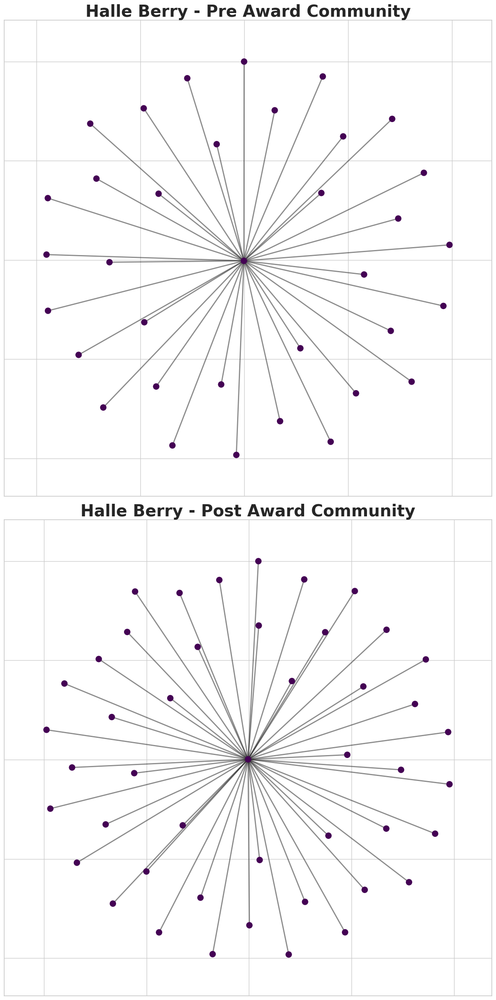

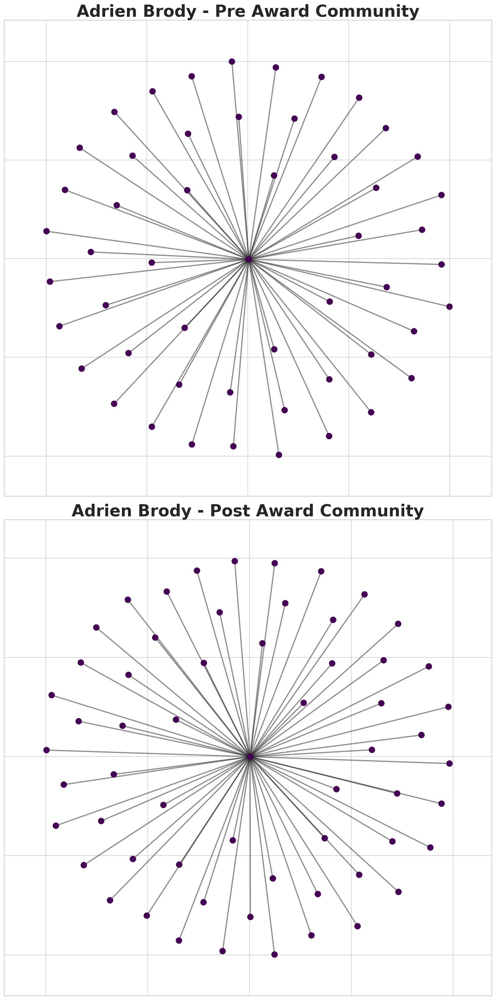

In [33]:
import community as community_louvain


def remove_isolated_nodes(graph):
    isolated = list(nx.isolates(graph))
    graph.remove_nodes_from(isolated)
    return graph

def graphframe_to_networkx(vertices, edges):
    G = nx.Graph()
    for row in vertices.collect():
        G.add_node(row.id, **row.asDict())
    for row in edges.collect():
        G.add_edge(row.src, row.dst, **row.asDict())
    return G

def process_and_convert_network(actor_name, start_year, end_year, vertices, edges):
    period_edges = edges.withColumn("collab", explode("collaborations")) \
                        .withColumn("collab_year", year_func("collab")) \
                        .filter((col("collab_year") >= start_year) & (col("collab_year") <= end_year) & 
                                ((col("src") == actor_name) | (col("dst") == actor_name))) \
                        .select("src", "dst")
    
    return graphframe_to_networkx(vertices, period_edges)
    
halle_pre_graph = process_and_convert_network('Halle Berry', 1997, 2001, vertices, edges)
halle_post_graph = process_and_convert_network('Halle Berry', 2003, 2007, vertices, edges)
brody_pre_graph = process_and_convert_network('Adrien Brody', 1998, 2002, vertices, edges)
brody_post_graph = process_and_convert_network('Adrien Brody', 2004, 2008, vertices, edges)

halle_pre_graph = remove_isolated_nodes(halle_pre_graph)
halle_post_graph = remove_isolated_nodes(halle_post_graph)
brody_pre_graph = remove_isolated_nodes(brody_pre_graph)
brody_post_graph = remove_isolated_nodes(brody_post_graph)

def detect_and_plot_communities_combined(pre_graph, post_graph, actor_name):
    fig, axes = plt.subplots(2, 1, figsize=(12, 24))  

    def plot_community(graph, ax, title):
        partition = community_louvain.best_partition(graph)
        pos = nx.spring_layout(graph, scale=2) 
        cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)
        nx.draw_networkx_nodes(graph, pos, node_size=100, cmap=cmap, node_color=list(partition.values()), ax=ax)  
        nx.draw_networkx_edges(graph, pos, alpha=0.5, width=2, ax=ax)  
        ax.set_title(title, fontsize=28, fontweight='bold')

    plot_community(pre_graph, axes[0], f"{actor_name} - Pre Award Community")
    
    plot_community(post_graph, axes[1], f"{actor_name} - Post Award Community")
    
    plt.tight_layout()  
    plt.savefig(f"charts/communities_{actor_name}_Combined.png", dpi=300) 
    plt.show()

detect_and_plot_communities_combined(halle_pre_graph, halle_post_graph, "Halle Berry")
detect_and_plot_communities_combined(brody_pre_graph, brody_post_graph, "Adrien Brody")

Analyzing Core Status: 100%|██████████| 12/12 [00:09<00:00,  1.29it/s]


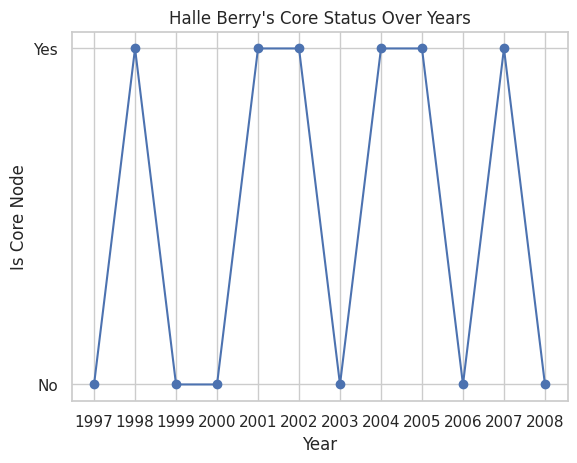

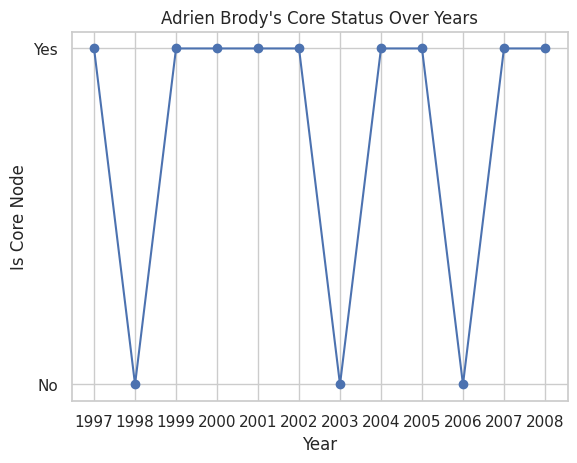

In [34]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from tqdm import tqdm

winners = ['Halle Berry', 'Adrien Brody']
winner_core_status = pd.DataFrame(columns=['Year', 'Winner', 'Core Status'])

# 标准化函数
def standardize_df(df):
    scaler = StandardScaler()
    return pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

# 主分析循环
for yr in tqdm(range(1997, 2009), desc="Analyzing Core Status"):
    year_dir = f'./results/{yr}'
    degree_df = pd.read_csv(f'{year_dir}/degree.csv')
    centrality_df = pd.read_csv(f'{year_dir}/centrality.csv')
    betweenness_df = pd.read_csv(f'{year_dir}/betweenness.csv')
    closeness_df = pd.read_csv(f'{year_dir}/closeness.csv')

    # 合并指标并标准化
    combined_df = pd.concat([degree_df.set_index('id'), centrality_df.set_index('id'), betweenness_df.set_index('id'), closeness_df.set_index('id')], axis=1)
    standardized_df = standardize_df(combined_df)

    standardized_df['composite_score'] = standardized_df.mean(axis=1)

    core_threshold = standardized_df['composite_score'].quantile(0.99)
    standardized_df['core_node'] = standardized_df['composite_score'] >= core_threshold

    for winner in winners:
        core_status = standardized_df.loc[winner, 'core_node'] if winner in standardized_df.index else False
        winner_core_status.loc[len(winner_core_status)] = [yr, winner, core_status]

for winner in winners:
    plt.figure()
    subset = winner_core_status[winner_core_status['Winner'] == winner]
    plt.plot(subset['Year'], subset['Core Status'], marker='o', linestyle='-')
    plt.title(f"{winner}'s Core Status Over Years")
    plt.xlabel('Year')
    plt.ylabel('Is Core Node')
    plt.xticks(range(1997, 2009))
    plt.yticks([0, 1], ['No', 'Yes'])
    plt.grid(True)
    plt.savefig(f"charts/core_status_{winner}.png")
    
plt.show()


                               SARIMAX Results                                
Dep. Variable:                 Degree   No. Observations:                   12
Model:                 ARIMA(1, 1, 1)   Log Likelihood                 -30.347
Date:                Fri, 05 Jan 2024   AIC                             66.695
Time:                        10:38:00   BIC                             67.889
Sample:                             0   HQIC                            65.942
                                 - 12                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6832      0.296     -2.305      0.021      -1.264      -0.102
ma.L1         -0.9992     68.053     -0.015      0.988    -134.381     132.382
sigma2        10.0669    683.188      0.015      0.9

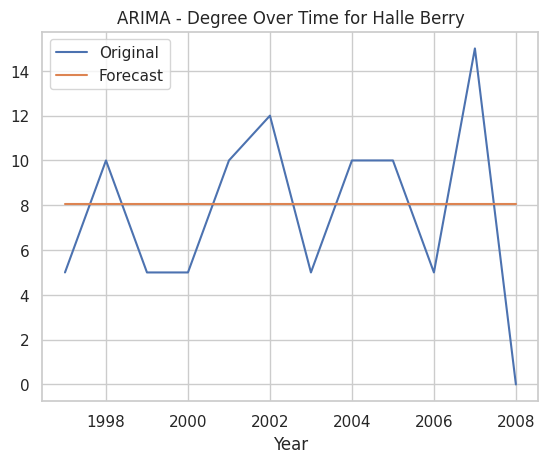

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import warnings

ts = halle_berry_metrics.set_index('Year')['Degree']

warnings.filterwarnings("ignore")


model = ARIMA(ts, order=(1, 1, 1))
model_fit = model.fit()

print(model_fit.summary())

ts.plot(label='Original')
model_fit.predict(start=ts.index[0], end=ts.index[-1], typ='levels').plot(label='Forecast')

plt.legend()
plt.title('ARIMA - Degree Over Time for Halle Berry')
plt.show()
